In [1]:
# importing necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.pyplot import figure
from datetime import timedelta
import matplotlib.lines as mlines

Figure 2 in the manuscript - Sample time-series of NEP for four selected sites and their probability density functions 


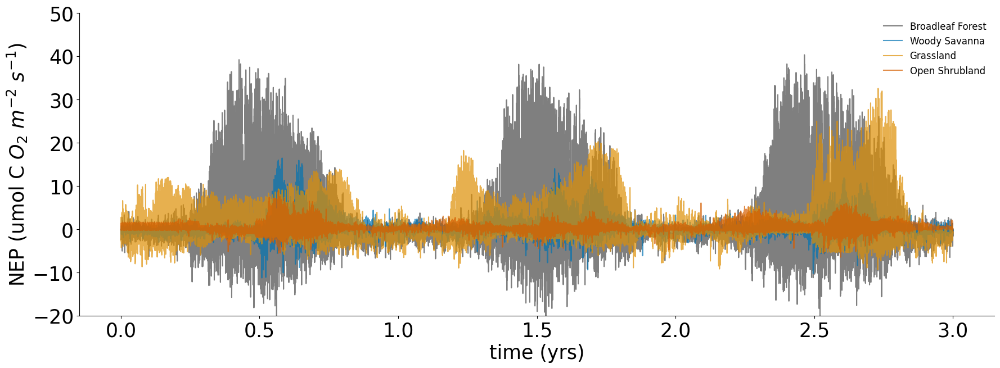

In [2]:

# importing necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.pyplot import figure
import seaborn as sns

# Loading data
df = pd.read_excel("/Users/nikhi/Desktop/PROJ1LIT/fluxnet sites/USSRM1113.xlsx")
df1 = pd.read_excel("/Users/nikhi/Desktop/PROJ1LIT/fluxnet sites/AURIGGRA_1113.xlsx")
df2 = pd.read_excel("/Users/nikhi/Desktop/PROJ1LIT/fluxnet sites/DKSOR0911_DBF.xlsx")
df3 = pd.read_excel("/Users/nikhi/Desktop/PROJ1LIT/fluxnet sites/USSRCOSH_0810.xlsx")

# Extracting NEE
x = df['NEE_OPPSIGN']
x1 = df1['NEE_OPPSIGN']
x2 = df2['NEE_OPPSIGN']
x3 = df3['NEE_OPPSIGN']

# Creating a colorblind-friendly palette
palette = sns.color_palette("colorblind", 4)

# plotting
fig, ax = plt.subplots(figsize=(21, 7))

time5 = [0, 0.5, 1, 1.5, 2, 2.5, 3]
ax.plot(np.linspace(0, 3, len(x2)), x2, color='#000000', alpha=0.5, label='Broadleaf Forest')
ax.plot(np.linspace(0, 3, len(x)), x, color=palette[0], alpha=0.7, label='Woody Savanna')
ax.plot(np.linspace(0, 3, len(x1)), x1, color=palette[1], alpha=0.7, label='Grassland')
ax.plot(np.linspace(0, 3, len(x3)), x3, color=palette[3], alpha=0.7, label='Open Shrubland')
ax.set_xlabel("time (yrs)", size='25')
ax.set_ylabel('NEP (umol C $O_{2}$ $m^{-2}$ $s^{-1}$)', fontsize=25)
ax.legend(loc='best', prop={'size': 14})
ax.tick_params(axis='both', labelsize=25)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_ylim(-20, 50)
ax.legend(loc='best', fontsize=12, frameon=False)
plt.show()



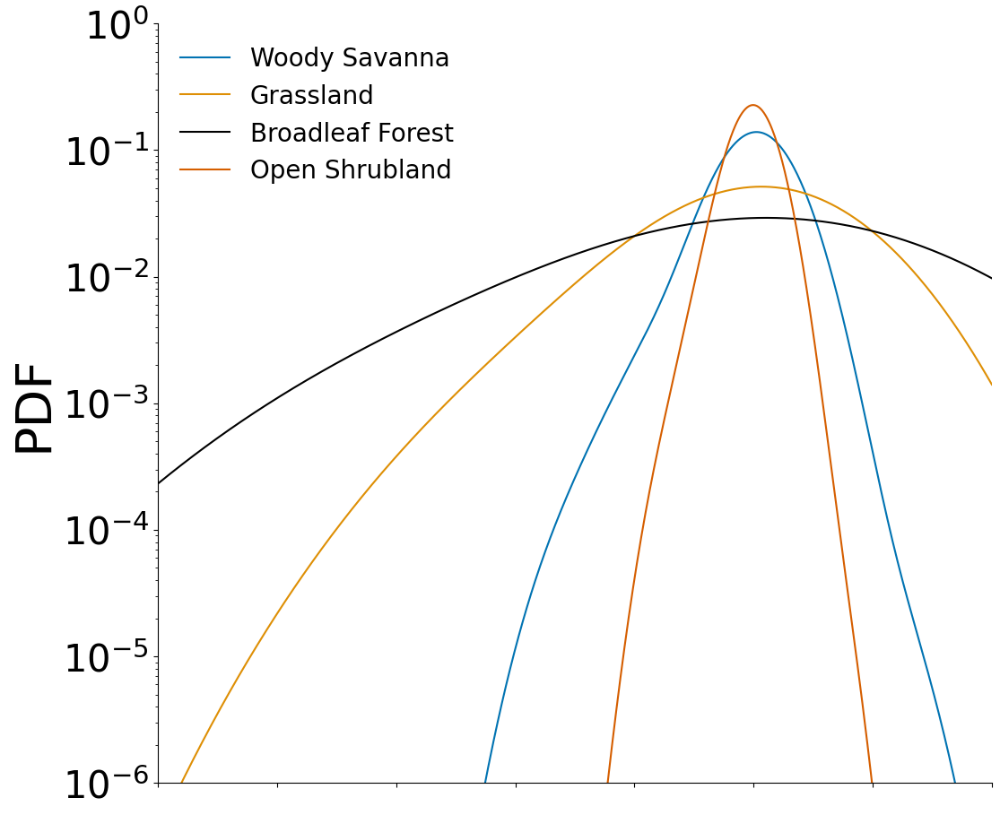

In [3]:
# plotting for corresponding PDFs

# importing necessary libraries
from scipy.stats import gaussian_kde

# extracting NEE
data1 = df['NEE_OPPSIGN']
data2 = df1['NEE_OPPSIGN']
data3 = df2['NEE_OPPSIGN']
data4 = df3['NEE_OPPSIGN']

# Creating Gaussian Kernel Density Estimates
kde1 = gaussian_kde(data1, bw_method=1.5)
kde2 = gaussian_kde(data2, bw_method=1.5)
kde3 = gaussian_kde(data3, bw_method=1.5)
kde4 = gaussian_kde(data4, bw_method=1.5)

# Defining the range for the histograms
x_range = np.linspace(50, -20, 1000)  # reversing the range
kde_values1 = kde1.evaluate(x_range)
kde_values2 = kde2.evaluate(x_range)
kde_values3 = kde3.evaluate(x_range)
kde_values4 = kde4.evaluate(x_range)

plt.figure(figsize=(12, 11))
plt.plot(x_range, kde_values1, label='Woody Savanna',color=palette[0] )
plt.plot(x_range, kde_values2, label='Grassland', color=palette[1])
plt.plot(x_range, kde_values3, label='Broadleaf Forest', color='#000000')
plt.plot(x_range, kde_values4, label='Open Shrubland', color=palette[3])

# Setting the y-axis to log scale and defining its limits
plt.yscale('log')
plt.ylim(1e-6, 1)

plt.ylabel('PDF', fontsize=40)
plt.legend(prop={'size': 20}, frameon=False)
plt.tick_params(axis='both', labelsize=30)
plt.xlim([50, -20])  # Reversed x-axis range
ax = plt.gca()  # Get current axes
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_xticklabels([])
plt.show()


In [5]:
# reading the necessary excel file
df = pd.read_excel("/Users/nikhi/Desktop/WITHP_VPD_FLUXNETSITES/AUGIN_WSA.xlsx")

In [7]:
# reading the necessary columns
x = df['NEE_OPPSIGN']
time = df['Timestamp']
gpp = df['GPP_NT_VUT_REF']
reco = df['RECO_NT_VUT_REF']
ta = df['TA']
gppd = df['GPP_DT_VUT_REF']
recod = df['RECO_DT_VUT_REF']
sw = df['SW']
vpd = df['VPD_F']

In [8]:
# defining statistics for threshold
def basic_stats(x, cnt):
    x_mean = np.mean(x)
    x_stdev = np.std(x)
    x_stdev_cnt = x_stdev * cnt
    upthr = x_mean + x_stdev_cnt
    res = {"upthr": upthr}  
    return res

In [9]:
# Getting peaks above the threshold
def get_filtered_peaks_and_other(a, thresholds):
    listup = []
    listup1 = []
    timeup1 = []
    listupindices = []
    listup1indices = []
    templistup = []
    timeup = []
    templistupindices = []

    for i in range(1, len(a)-1):
        if a[i] >= thresholds['upthr'] and a[i] != a[i+1] and a[i-1] < a[i] and a[i+1] < a[i]:
            listup.append(a[i])
            listupindices.append(a[i])
        elif a[i] >= thresholds['upthr'] and a[i] == a[i+1] and a[i-1] < a[i] and a[i+2] < a[i]:
            listup1.append(a[i])
            timeup1.append(time[i])
            listup1indices.append(a[i])
    
    for i in range(1, len(a)-1):
        if a[i] >= thresholds['upthr'] and a[i-1] < a[i] and a[i+1] < a[i]:
            templistup.append(a[i]) 
            timeup.append(time[i])
            templistupindices.append(i)

    upvalues_list = listup + listup1
    up_time = timeup + timeup1
    filtered_peaks = list(zip(up_time, upvalues_list))
    return templistup, timeup, templistupindices, listupindices, listup1indices, filtered_peaks


In [10]:
def pick_points(a, thresholds):
    all_points_above = []
    for i in range(len(a)):
        if a[i] >= thresholds['upthr']:
            all_points_above.append(a[i])
    return all_points_above

In [11]:
# Selecting peaks based on tau of +/-6
def tau_points(filtered_peaks):
    selected_peaks = []
    if len(filtered_peaks) == 0:
        pass

    start = 0
    maximum_peak = filtered_peaks[0][1]
    selected_peak_index = 0
    interval = timedelta(hours=6)

    for j in range(1, len(filtered_peaks)):
        if j >= len(filtered_peaks):
            break
        
        if filtered_peaks[j][0] - filtered_peaks[start][0] >= interval:
            selected_peaks.append(selected_peak_index)
            maximum_peak = -1
            while j < len(filtered_peaks) and filtered_peaks[j][0] - filtered_peaks[selected_peak_index][0] < interval:
                j = j + 1
            if j >= len(filtered_peaks):
                break
            start = j
            maximum_peak = -1

        if filtered_peaks[j][1] > maximum_peak:
            maximum_peak = filtered_peaks[j][1]
            selected_peak_index = j

    if maximum_peak != -1:
        selected_peaks.append(selected_peak_index)

    golden_peaks = []

    for i in selected_peaks:
        golden_peaks.append(filtered_peaks[i])

    golden_peaks_df = pd.DataFrame(golden_peaks, columns=['Timestamp', 'golden_peaks'])
    golden_peaks_df.head()
    gp = golden_peaks_df.sort_values(by="Timestamp")
    gp = gp.reset_index(drop=True)
    return gp

In [13]:
# Getting fluctuation paths 
def fluctuation_paths(golden_peaks_df, columns, data_frame, output_name):
    gp = golden_peaks_df
    golden_peaks_tstat = pd.DataFrame(gp, columns=['Timestamp'])
    gp["Timestamp"] = pd.to_datetime(gp["Timestamp"])
    freq = 'H'
    date = gp["Timestamp"] + pd.Timedelta(6, unit=freq)
    dateminus = gp["Timestamp"] + pd.Timedelta(-6, unit=freq)
    lower_bound = list(dateminus)
    upper_bound = list(date)
    bounds = dict()

    for i in range(0, len(lower_bound)):
        date_lower = lower_bound[i]
        date_upper = upper_bound[i]
        df_copy = data_frame.copy()
        df_copy = df_copy[df_copy['Timestamp'] >= date_lower]
        df_copy = df_copy[df_copy['Timestamp'] <= date_upper]
        bounds[i] = df_copy

        df0 = df_copy.copy()
        df0 = df0.reset_index(drop=True)
        df0 = df0.drop(columns=['Timestamp','TA', 'SW','GPP_DT_VUT_REF','RECO_DT_VUT_REF','RECO_NT_VUT_REF','GPP_NT_VUT_REF','SWC_F_MDS_1','VPD_F','P_F','AVG_P','AVG_VPD'], axis=1)
        df0.columns = [output_name + str(i+1)]
        if i == 0:
            df_all = df0.copy()
        else:
            df_all = df_all.join(df0)
    return df_all


In [14]:
# normalizing FPs
def divide_cells(df_all):
    cell_values = df_all.iloc[12, :].values.tolist()
    divided_df_all = df_all.div(cell_values)
    divided_df_all_avg = divided_df_all.mean(axis=1)
    
    return divided_df_all, divided_df_all_avg


In [15]:
# Getting fluctuation paths for specific threshold
coeff = [2.23]
fp_values = []  
fp_avg_values = []  

for c in coeff:
    thresholds = basic_stats(x, c)
    templistup, timeup, templistupindices, listupindices, listup1indices, filtered_peaks = get_filtered_peaks_and_other(x, thresholds)
    allpointsaboveUL = pick_points(x, thresholds)
    neegp = tau_points(filtered_peaks)
    columns = ['Timestamp', 'TA', 'SW', 'GPP_DT_VUT_REF', 'RECO_DT_VUT_REF','RECO_NT_VUT_REF','GPP_NT_VUT_REF','SWC_F_MDS_1''VPD_F','P_F','AVG_P','AVG_VPD']
    output_name = 'NEE'
    df_allNEE = fluctuation_paths(neegp, columns, df, output_name)
    divided_df_all, divided_df_all_avg = divide_cells(df_allNEE)
    fp_values.append(divided_df_all)
    fp_avg_values.append(divided_df_all_avg)

/var/folders/tc/krjl03bn2cgbs5z5128vc9y80000gn/T/ipykernel_3132/259731314.py:7: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  date = gp["Timestamp"] + pd.Timedelta(6, unit=freq)
/var/folders/tc/krjl03bn2cgbs5z5128vc9y80000gn/T/ipykernel_3132/259731314.py:8: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  dateminus = gp["Timestamp"] + pd.Timedelta(-6, unit=freq)


Figures S2 and S3 in the Supplementary information - Fluctuation paths (light gray) and their average (thick dark gray) for all fluctuations (coeff = 0) and top 1% fluctuations  

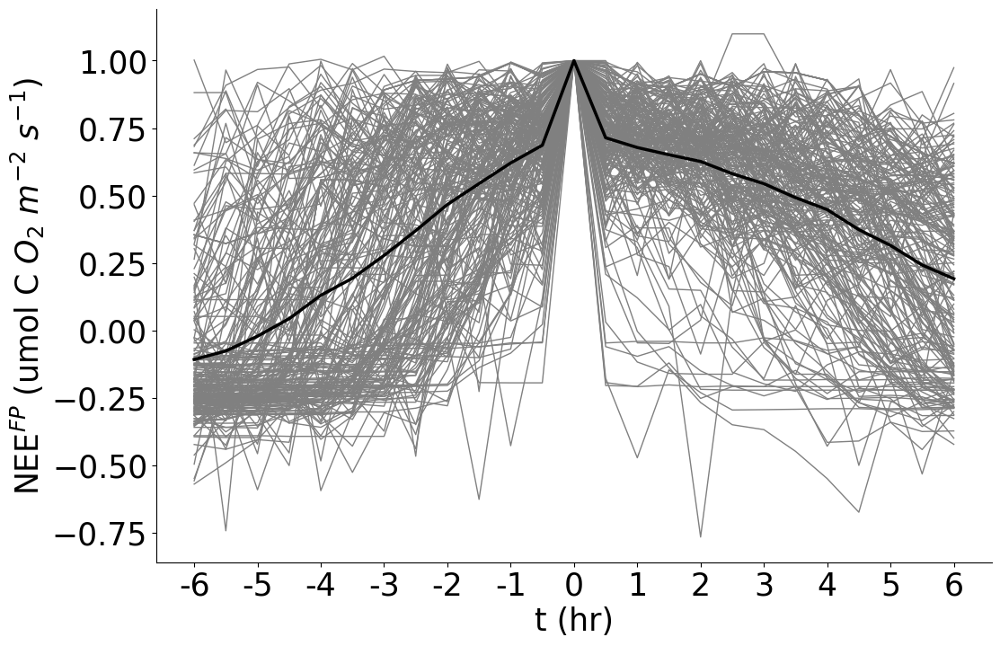

In [16]:
# Plotting FPs and AVG_FP
fig, ax = plt.subplots(figsize=(12, 8))

x_tick_labels = (-6,-5.5,-5,-4.5,-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0.5,1,1.5,2,2.5,3,3.5,4,4.5,5,5.5,6)
cl = divided_df_all.columns

for i in range(len(cl)):
    ax.plot(x_tick_labels, divided_df_all[cl[i]], label=cl[i], color='grey', lw=1)

ax.plot(x_tick_labels, divided_df_all_avg, lw=2.5, color='k', label="avg")

ax.set_xticks(x_tick_labels)
ax.set_xticklabels(x_tick_labels)
xticks = ax.xaxis.get_major_ticks()
hidden_indices = [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23]

for index in hidden_indices:
    xticks[index].label1.set_visible(False)
    xticks[index].tick1line.set_visible(False)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.xlabel("t (hr)", size='25')
plt.ylabel('NEE$^{FP}$ (umol C $O_{2}$ $m^{-2}$ $s^{-1}$)', fontsize=25)
plt.show()


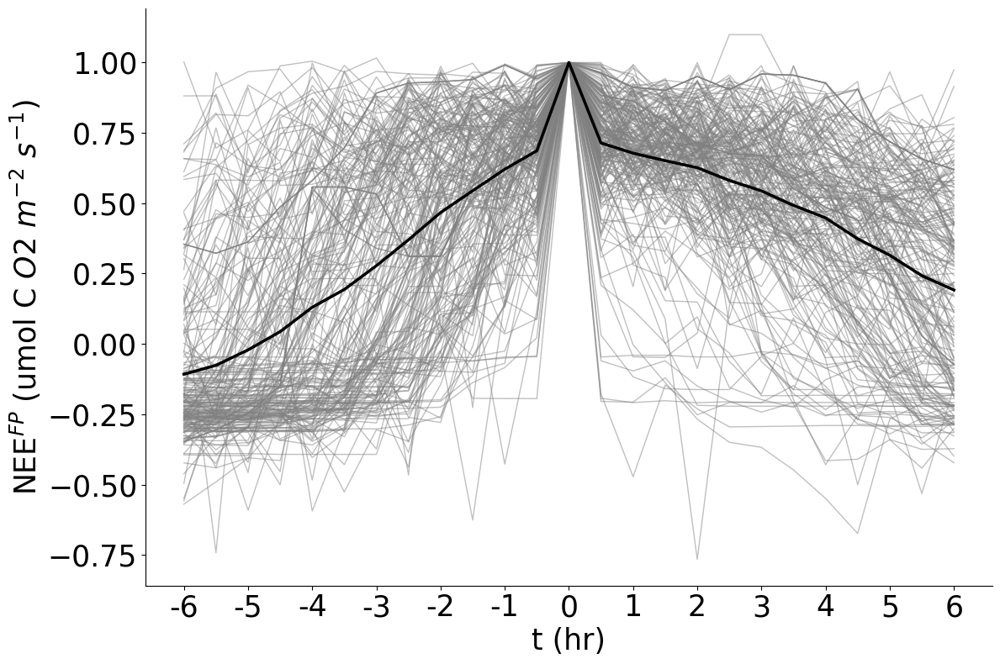

In [17]:
# To handle outliers for specfic sites (US-SRM, US-SRG and ES-LJu)

# Defining function to handle outliers
def handle_outliers(df, n_std=5):
    mean = df.values.mean()
    std = df.values.std()
    lower_bound = mean - n_std * std
    upper_bound = mean + n_std * std
    return df.clip(lower=lower_bound, upper=upper_bound)

handled_df_all = handle_outliers(divided_df_all)
handled_df_all_avg = handled_df_all.mean(axis=1)

# Plotting FPs and FP_AVG after handling outliers

fig, ax = plt.subplots(figsize=(12, 8))
x_tick_labels = (-6,-5.5,-5,-4.5,-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0.5,1,1.5,2,2.5,3,3.5,4,4.5,5,5.5,6)
cl = handled_df_all.columns

for i in range(len(cl)):
    ax.plot(x_tick_labels, handled_df_all[cl[i]], color='grey', lw=1, alpha=0.5)

ax.plot(x_tick_labels, handled_df_all_avg, lw=2.5, color='k', label="Average")

ax.set_xticks(x_tick_labels)
ax.set_xticklabels(x_tick_labels)
xticks = ax.xaxis.get_major_ticks()
hidden_indices = [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23]

for index in hidden_indices:
    xticks[index].label1.set_visible(False)
    xticks[index].tick1line.set_visible(False)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)  # Corrected line
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.xlabel("t (hr)", size='25')
plt.ylabel('NEE$^{FP}$ (umol C $O{2}$ $m^{-2}$ $s^{-1}$)', fontsize=25)
# plt.title("NEE Fluctuation Paths (Outliers Handled)", fontsize=25)
# plt.legend(fontsize=20)
plt.tight_layout()
plt.show()



In [18]:
# splitting df_all into towards and away
def get_ac_coeffs(divided_df_all, gp):
    divided_df_all = pd.DataFrame(divided_df_all)
    up_dfall = divided_df_all.iloc[0:13]
    low_dfall = divided_df_all.iloc[12:25]
    up1_dfall = up_dfall.reindex(index=up_dfall.index[::-1])
    idx2 = up1_dfall.reset_index()
    idx1 = low_dfall.reset_index()
    diff_df = idx1.sub(idx2)
    ac = diff_df.drop(columns=['index'])
    ac_avg = ac.mean(axis=1)
    return ac, ac_avg


In [19]:
# getting asymmetry coefficient for specific threshold
coeff = [2.23]
ac_values = [] 
ac_avg_values = []  

for c in coeff:
    thresholds = basic_stats(x, c)
    templistup, timeup, templistupindices, listupindices, listup1indices, filtered_peaks = get_filtered_peaks_and_other(x, thresholds)
    allpointsaboveUL = pick_points(x, thresholds)
    neegp = tau_points(filtered_peaks)
    columns = ['Timestamp', 'TA', 'SW', 'GPP_DT_VUT_REF', 'RECO_DT_VUT_REF', 'RECO_NT_VUT_REF', 'GPP_NT_VUT_REF', 'SWC_F_MDS_1','VPD_F','P_F','AVG_P','AVG_VPD']
    output_name = 'NEE'
    df_allNEE = fluctuation_paths(neegp, columns, df, output_name)
    divided_df_all, divided_df_all_avg = divide_cells(df_allNEE)
    ac, ac_avg = get_ac_coeffs(divided_df_all, neegp)
    ac_values.append(ac)
    ac_avg_values.append(ac_avg)

/var/folders/tc/krjl03bn2cgbs5z5128vc9y80000gn/T/ipykernel_3132/259731314.py:7: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  date = gp["Timestamp"] + pd.Timedelta(6, unit=freq)
/var/folders/tc/krjl03bn2cgbs5z5128vc9y80000gn/T/ipykernel_3132/259731314.py:8: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  dateminus = gp["Timestamp"] + pd.Timedelta(-6, unit=freq)


Figures S4 and S5 in the Supplementary information - Asymmetry Coefficients (light gray) and their average (thick dark gray) for all fluctuations (coeff = 0) and top 1% fluctuations  

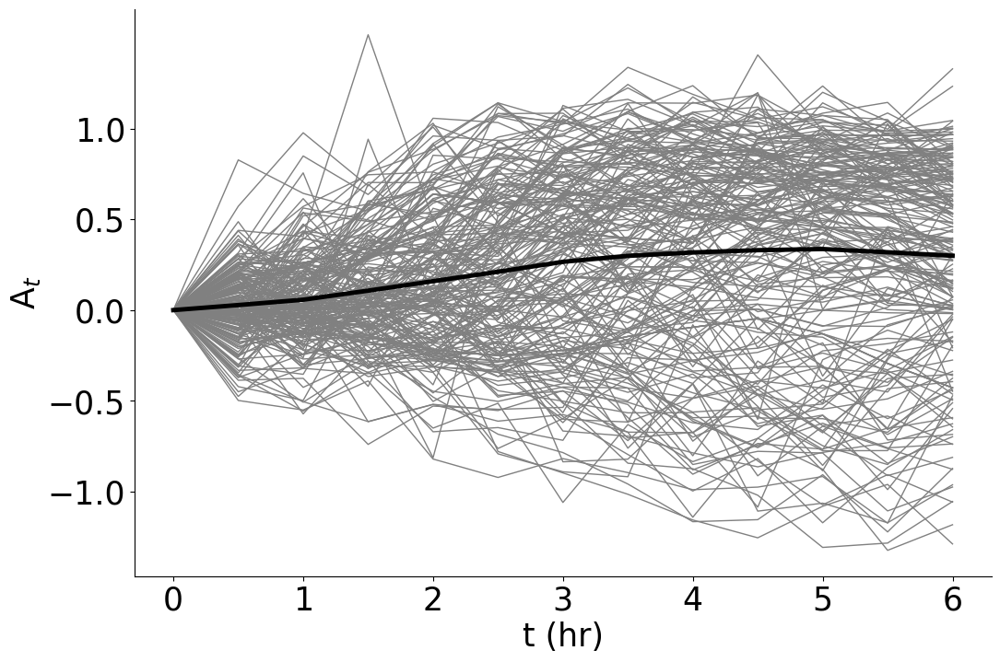

In [20]:
# Plotting Asymmetry and AC_AVG

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111)
cl = ac.columns
for i in range(len(cl)):
    ax.plot(ac[cl[i]], label=cl[i], lw=1, color='grey')

# Plotting the average
ax.plot(ac_avg, lw=3.5, color='black', label="avg")

plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.xlabel("t (hr)", size='25')
plt.ylabel('A$_{t}$', fontsize=25)
x_tick_labels = (0, 0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4, 4.5, 5, 5.5, 6)
ax.set_xticks(range(len(x_tick_labels)))
ax.set_xticklabels(x_tick_labels)
xticks = ax.xaxis.get_major_ticks()
hidden_indices = [1, 3, 5, 7, 9, 11]

for index in hidden_indices:
    if index < len(xticks):
        xticks[index].label1.set_visible(False)
        xticks[index].tick1line.set_visible(False)
ax.set_yticks(np.arange(-1, 1.1, 0.5))
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.show()


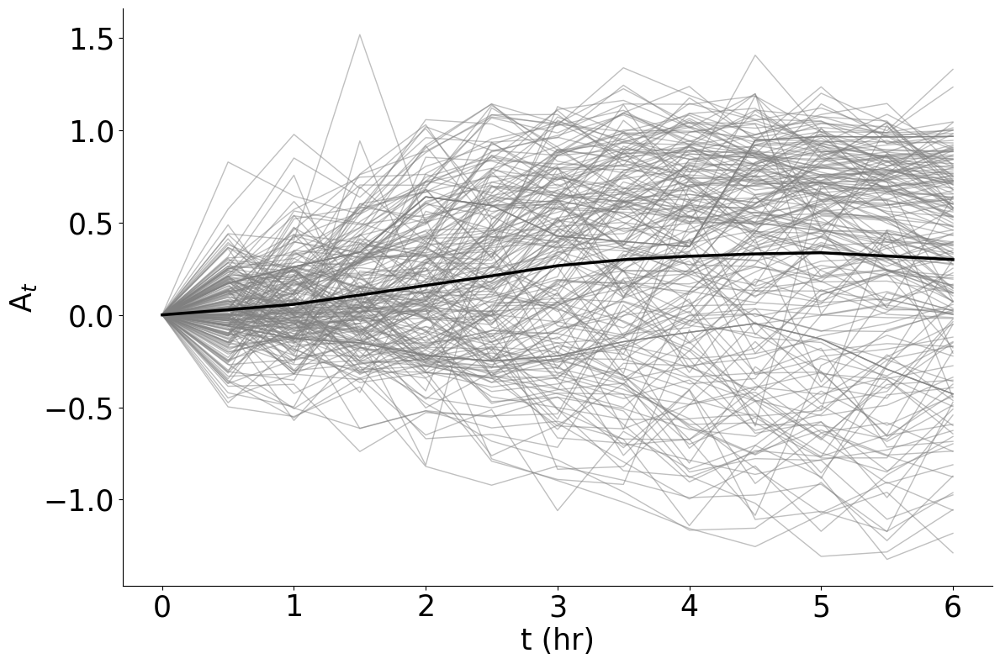

In [21]:
# To handle outliers for specfic sites (US-SRM, US-SRG and ES-LJu)

# Defining function to handle outliers
def handle_outliers(df, n_std=5):
    mean = df.values.mean()
    std = df.values.std()
    lower_bound = mean - n_std * std
    upper_bound = mean + n_std * std
    return df.clip(lower=lower_bound, upper=upper_bound)


handled_ac = handle_outliers(ac)
handled_ac_avg = handled_ac.mean(axis=1)

# Plotting Asymmetry and AC_AVG after handling outliers
fig, ax = plt.subplots(figsize=(12, 8))

x_tick_labels = (0, 0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4, 4.5, 5, 5.5, 6)
cl = handled_ac.columns

for i in range(len(cl)):
    ax.plot(x_tick_labels, handled_ac[cl[i]], color='grey', lw=1, alpha=0.5)

ax.plot(x_tick_labels, handled_ac_avg, lw=2.5, color='k', label="Average")

ax.set_xticks(x_tick_labels)
ax.set_xticklabels(x_tick_labels)
xticks = ax.xaxis.get_major_ticks()
hidden_indices = [1, 3, 5, 7, 9, 11]

for index in hidden_indices:
    if index < len(xticks):
        xticks[index].label1.set_visible(False)
        xticks[index].tick1line.set_visible(False)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.xlabel("t (hr)", size='25')
plt.ylabel('A$_{t}$', fontsize=25)
plt.tight_layout()
plt.show()



In [22]:
# Storing FP average values
fp_avg_df = pd.DataFrame(divided_df_all_avg)
# top 1% fluctuations
divided_df_all_avg.to_excel("/Users/nikhi/Desktop/PROJ1LIT/fluxnet sites/TOP1FPSFORFIG3NEW/AUGINFPAVG.xlsx", index=False)
# all fluctuations
divided_df_all_avg.to_excel("/Users/nikhi/Desktop/PROJ1LIT/fluxnet sites/ALLFPSFORFIG3NEW/AUGINFPAVG.xlsx", index=False)


In [23]:
# Storing asymmetry average values
ac_avg_df = pd.DataFrame(ac_avg)
# top 1% fluctuations
ac_avg_df.to_excel("/Users/nikhi/Desktop/PROJ1LIT/fluxnet sites/TOP1FPSFORFIG3NEW/AUGINACAVG.xlsx", index=False)
# all fluctuations
ac_avg_df.to_excel("/Users/nikhi/Desktop/PROJ1LIT/fluxnet sites/ALLFPSFORFIG3NEW/AUGINACAVG.xlsx", index=False)


Figure 3 in the manuscript - Average Fluctuation paths and Average Asymmetry coefficient for all fluctuations and top 1% fluctuations for all sites

In [24]:
# importing necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Loading all FPs and ACs and top 1% FPs and ACs data
top1_fp = pd.read_excel("/Users/nikhi/Desktop/PROJ1LIT/fluxnet sites/TOP1FPSFORFIG3NEW/ALLSITESTOP1FPAVG.xlsx")
top1_ac = pd.read_excel("/Users/nikhi/Desktop/PROJ1LIT/fluxnet sites/TOP1FPSFORFIG3NEW/ALLSITESTOP1ACAVG.xlsx")
all_fp  = pd.read_excel("/Users/nikhi/Desktop/PROJ1LIT/fluxnet sites/ALLFPSFORFIG3NEW/ALLSITESALLFPSAVG.xlsx")
all_ac  = pd.read_excel("/Users/nikhi/Desktop/PROJ1LIT/fluxnet sites/ALLFPSFORFIG3NEW/ALLSITESALLACSAVG.xlsx")

# Setting colors and linestyles
palette = sns.color_palette("colorblind", 8)
spec_colors = {'USSRM': palette[0], 'AURIG': palette[1], 'USSRC': palette[3], 'DKSOR': '#000000'}
pft_colors = {
    'Woody Savanna': spec_colors['USSRM'],
    'Evergreen Needle Forest': palette[2],
    'Deciduous Broadleaf Forest': spec_colors['DKSOR'],
    'Open Shrubland': spec_colors['USSRC'],
    'Evergreen Broadleaf Forest': palette[7],
    'Grassland': spec_colors['AURIG'],
    'Savanna': palette[5],
}
pft_ls = {
    'Woody Savanna': ['-', '--'],
    'Evergreen Needle Forest': ['-', '-.'],
    'Deciduous Broadleaf Forest': ['-', ':'],
    'Open Shrubland': ['-', '--'],
    'Evergreen Broadleaf Forest': ['-', '-.'],
    'Grassland': ['-', ':'],
    'Savanna': ['-'],
}

site_labels = {
    'AUGIN': ('Woody Savanna', 'AU-Gin'),
    'USSRM': ('Woody Savanna', 'US-SRM'),
    'CNQIA': ('Evergreen Needle Forest', 'CN-Qia'),
    'NLLOO': ('Evergreen Needle Forest', 'NL-Loo'),
    'DKSOR': ('Deciduous Broadleaf Forest', 'DK-Sor'),
    'USOHO': ('Deciduous Broadleaf Forest', 'US-Oho'),
    'ESLJU': ('Open Shrubland', 'ES-LJu'),
    'USSRC': ('Open Shrubland', 'US-SRC'),
    'CNDIN': ('Evergreen Broadleaf Forest', 'CN-Din'),
    'MYPSO': ('Evergreen Broadleaf Forest', 'MY-PSO'),
    'AURIG': ('Grassland', 'AU-Rig'),
    'USSRG': ('Grassland', 'US-SRG'),
    'AUDAS': ('Savanna', 'AU-DaS'),
}

In [25]:
#Setting x ticks for FPs and ACs
x_ticks_fp = (-6,-5.5,-5,-4.5,-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0.5,1,1.5,2,2.5,3,3.5,4,4.5,5,5.5,6)
x_ticks_ac = (0, 0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4, 4.5, 5, 5.5, 6)

# Plotting  
def plot_panel(ax, df, kind, title_prefix, labelpad=10):
    pft_cnt = {p: 0 for p in pft_colors}
    for site_key, (pft, site_name) in site_labels.items():
        if site_key not in df.columns:
            continue
        color = pft_colors[pft]
        linestyle = pft_ls[pft][pft_cnt[pft] % len(pft_ls[pft])]
        pft_cnt[pft] += 1

        if kind == "fp":
            ax.plot(x_ticks_fp, df[site_key], lw=7, color=color, linestyle=linestyle, label=f"{pft} - {site_name}")
        else:
            ax.plot(range(len(x_ticks_ac)), df[site_key], lw=7, color=color, linestyle=linestyle, label=f"{pft} - {site_name}")

    if kind == "fp":
        ax.set_xticks(x_ticks_fp)
        ax.set_xticklabels(x_ticks_fp)
        hide = [1,3,5,7,9,11,13,15,17,19,21,23]
        ticks = ax.xaxis.get_major_ticks()
        for i in hide:
            if i < len(ticks):
                ticks[i].label1.set_visible(False)
                ticks[i].tick1line.set_visible(False)
        ax.set_xlabel("t (hr)", size=125, labelpad=labelpad)
        ax.set_ylabel('NEE$^{FP}_{t}$ (μmol CO$_2$ m$^{-2}$ s$^{-1}$)', size=125)
    else:
        ax.set_xticks(range(len(x_ticks_ac)))
        ax.set_xticklabels(x_ticks_ac)
        hide = [1,3,5,7,9,11]
        ticks = ax.xaxis.get_major_ticks()
        for i in hide:
            if i < len(ticks):
                ticks[i].label1.set_visible(False)
                ticks[i].tick1line.set_visible(False)
        ax.set_xlabel("t (hr)", size=125, labelpad=labelpad)
        ax.set_ylabel('$\\overline{A_{t}}$', size=125)

    ax.tick_params(axis='both', labelsize=125)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_linewidth(5)
    ax.spines['left'].set_linewidth(5)
    
    ax.set_title(title_prefix, fontsize=125)

fig, axes = plt.subplots(2, 2, figsize=(150, 105))
plt.rcParams['axes.titlepad'] = 100  
# Panel (a) - All FPs
plot_panel(axes[0,0], all_fp,  "fp",
           "(a) Average fluctuation paths for all fluctuations for all the sites")
# Panel (b) - All ACs
plot_panel(axes[0,1], all_ac,  "ac",
           "(b) Average asymmetry coefficients for all fluctuations for all the sites")
# Panel (c) - Top 1% FPs
plot_panel(axes[1,0], top1_fp, "fp",
           "(c) Average Fluctuation paths for top 1% fluctuations for all the sites     ")
# Panel (d) - Top 1% ACs
plot_panel(axes[1,1], top1_ac, "ac",
           "(d) Average Asymmetry coefficients for top 1% fluctuations for all the sites")

pft_groups = {}
for site_key, (pft, site_name) in site_labels.items():
    pft_groups.setdefault(pft, []).append(site_name)

legend_handles = []
for pft, color in pft_colors.items():
    if pft in pft_groups:
        legend_handles.append(plt.Line2D([0], [0], color=color, lw=15, label=pft))
        for idx, site_name in enumerate(pft_groups[pft]):
            linestyle = pft_ls[pft][idx % len(pft_ls[pft])]
            legend_handles.append(plt.Line2D([0], [0], color=color, linestyle=linestyle, label=site_name))

fig.legend(handles=legend_handles, loc='center left', bbox_to_anchor=(0.95, 0.6),
           fontsize=102, title="Plant Functional Types and Sites", title_fontsize=117, frameon=False)

plt.show()


Figure S6 in the Supplementary information -Asymmetry variation between threshold=mean (c=0) and threshold for top 1% fluctuations for all sites for 3 years 

In [27]:
# Providing coefficients to get ac and ac_avg variation with changing threshold
coeff = [0, 2.23]
ac_values = []  
ac_avg_values = []

for c in coeff:
    thresholds = basic_stats(x, c)
    templistup, timeup, templistupindices, listupindices, listup1indices, filtered_peaks = get_filtered_peaks_and_other(x, thresholds)
    allpointsaboveUL = pick_points(x, thresholds)
    neegp = tau_points(filtered_peaks)
    columns = ['Timestamp', 'TA', 'SW', 'GPP_DT_VUT_REF', 'RECO_DT_VUT_REF', 'RECO_NT_VUT_REF', 'GPP_NT_VUT_REF', 'SWC_F_MDS_1','VPD_F','P_F','AVG_P','AVG_VPD']
    output_name = 'NEE'
    df_allNEE = fluctuation_paths(neegp, columns, df, output_name)
    divided_df_all, divided_df_all_avg = divide_cells(df_allNEE)
    ac, ac_avg = get_ac_coeffs(divided_df_all, neegp)
    ac_values.append(ac)
    ac_avg_values.append(ac_avg)


/var/folders/tc/krjl03bn2cgbs5z5128vc9y80000gn/T/ipykernel_3132/259731314.py:7: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  date = gp["Timestamp"] + pd.Timedelta(6, unit=freq)
/var/folders/tc/krjl03bn2cgbs5z5128vc9y80000gn/T/ipykernel_3132/259731314.py:8: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  dateminus = gp["Timestamp"] + pd.Timedelta(-6, unit=freq)
/var/folders/tc/krjl03bn2cgbs5z5128vc9y80000gn/T/ipykernel_3132/259731314.py:7: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  date = gp["Timestamp"] + pd.Timedelta(6, unit=freq)
/var/folders/tc/krjl03bn2cgbs5z5128vc9y80000gn/T/ipykernel_3132/259731314.py:8: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  dateminus = gp["Timestamp"] + pd.Timedelta(-6, unit=freq)


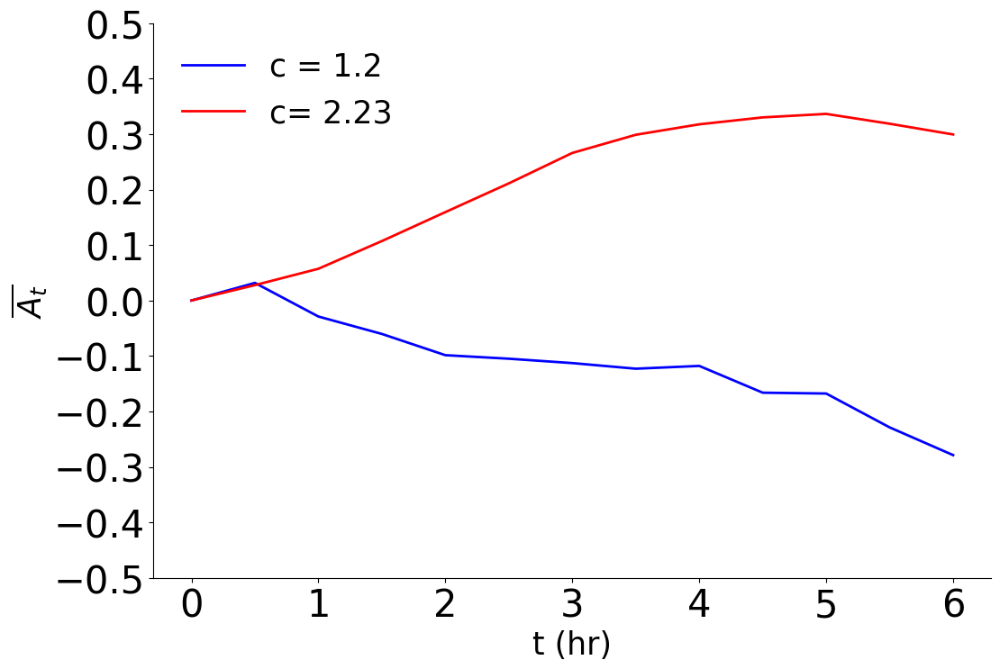

In [28]:
# plotting asymmetry variation with threshold
colors = ['b', 'r']
legend_labels = [ 'c = 1.2',  'c= 2.23']

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111)

for i in range(0, len(coeff)):
    ax.plot(ac_avg_values[i], lw=2, color=colors[i])

ax.set_xlabel("t (hr)", size='25')
ax.set_ylabel('$\overline{A_{t}}$', size='25')
ax.tick_params(axis='both', labelsize=20) 
ax.set_ylim(-0.5, 0.5) 
ax.set_yticks(np.arange(-0.5, 0.51, step=0.1))
x_tick_labels = (0, 0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4, 4.5, 5, 5.5, 6)
ax.set_xticks(range(len(x_tick_labels)))
ax.set_xticklabels(x_tick_labels)
ax.tick_params(axis='both', labelsize=30)
xticks = ax.xaxis.get_major_ticks()
hidden_indices = [1, 3, 5, 7, 9, 11]

for index in hidden_indices:
    if index < len(xticks):
        xticks[index].label1.set_visible(False)
        xticks[index].tick1line.set_visible(False)

ax.legend(legend_labels, loc='best', prop={'size': 25},frameon=False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

plt.show()

Figure 4 in the manuscript - plotting the relationship between (a) Amax for all fluctuations versus the matching VPD average and (b) Amax at the top 1% (c = 99%) versus the 3-year temperature average for each site


In [29]:
# importing necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from sklearn.metrics import mean_squared_error, r2_score
from scipy import stats
import seaborn as sns
import matplotlib.ticker as mticker  

# Creating colorblind-friendly palette and defining color for each PFT
palette = sns.color_palette("colorblind", 8)
spec_colors = {
    'USSRM': palette[0],  
    'AURIG': palette[1],  
    'USSRC': palette[3],  
    'DKSOR': '#000000'  
}
pft_colors = {
    'Woody Savanna': spec_colors['USSRM'], 
    'Evergreen Needle Forest': palette[2], 
    'Deciduous Broadleaf Forest': spec_colors['DKSOR'], 
    'Open Shrubland': spec_colors['USSRC'],
    'Evergreen Broadleaf Forest': palette[7],  
    'Grassland': spec_colors['AURIG'],
    'Savanna': palette[5]
}

# Loading data
file_names = [
    "AUGINTEMP.xlsx", "CNQIATEMP.xlsx", "CNDINTEMP.xlsx", "DKSORTEMP.xlsx", 
    "ESLJUTEMP.xlsx", "NLLOOTEMP.xlsx", "AUDASTEMP.xlsx", "USOHOTEMP.xlsx", 
    "MYPSOTEMP.xlsx", "USSRMTEMP.xlsx", "USSRCTEMP.xlsx", "AURIGTEMP.xlsx", 
    "USSRGTEMP.xlsx"
]

vpd_file_names = [
    "AUGIN.xlsx", "CNQIA.xlsx", "CNDIN.xlsx", "DKSOR.xlsx",
    "ESLJU.xlsx", "NLLOO.xlsx", "AUDAS.xlsx", "USOHO.xlsx",
    "MYPSO.xlsx", "USSRM.xlsx", "USSRC.xlsx", "AURIG.xlsx",
    "USSRG.xlsx"
]

# defining markers
markers = ['o', 's', '^', 'D', '*', 'X', '<', '>', 'd', '8', 'p', 'h', 'D']

site_labels = {
    'AUGIN': ('Woody Savanna', 'AU-Gin'),
    'USSRM': ('Woody Savanna', 'US-SRM'),
    'CNQIA': ('Evergreen Needle Forest', 'CN-Qia'),
    'NLLOO': ('Evergreen Needle Forest', 'NL-Loo'),
    'DKSOR': ('Deciduous Broadleaf Forest', 'DK-Sor'),
    'USOHO': ('Deciduous Broadleaf Forest', 'US-Oho'),
    'ESLJU': ('Open Shrubland', 'ES-LJu'),
    'USSRC': ('Open Shrubland', 'US-SRC'),
    'CNDIN': ('Evergreen Broadleaf Forest', 'CN-Din'),
    'MYPSO': ('Evergreen Broadleaf Forest', 'MY-PSO'),
    'AURIG': ('Grassland', 'AU-Rig'),
    'USSRG': ('Grassland', 'US-SRG'),
    'AUDAS': ('Savanna', 'AU-DaS'),
}

In [30]:
# Loading temperature data
temp_data = {}
for file, marker in zip(file_names, markers):
    site_val = file[:5]
    if site_val in site_labels:
        pft, label = site_labels[site_val]
        color = pft_colors[pft]
        df = pd.read_excel(f"/Users/nikhi/Desktop/PROJ1LIT/fluxnet sites/ERRORBAR/3YRTEMP/{file}")
        temp_3yr = df.iloc[0, 1]   
        peakstemp = df.iloc[:, 0]
        meanactemp = float(np.mean(peakstemp))
        stdactemp = float(np.std(peakstemp))
        temp_data[label] = {
            "temp_3yr": float(temp_3yr), 
            "meanactemp": meanactemp, 
            "stdactemp": stdactemp, 
            "marker": marker, 
            "color": color
        }

temp_x_data = np.array([v["temp_3yr"] for v in temp_data.values()], dtype=float)
temp_y_data = np.array([v["meanactemp"] for v in temp_data.values()], dtype=float)

# Calculating Pearson correlation 
temp_correlation, temp_p_value = stats.pearsonr(temp_x_data, temp_y_data)



In [31]:
# Loading VPD data
mtch_vpd_data = {}
for file, marker in zip(vpd_file_names, markers):
    site_val = file[:5]
    if site_val in site_labels:
        pft, label = site_labels[site_val]
        color = pft_colors[pft]
        df = pd.read_excel("/Users/nikhi/Desktop/PROJ1LIT/fluxnet sites/ERRORBAR/ALLFLUC_VPD/" + file)
        allflucpeaksvpd = df.iloc[:, 0]
        vpd_mtch = df.iloc[0, 2]
        mtch_meanacvpd = float(np.mean(allflucpeaksvpd))
        mtch_stdacvpd = float(np.std(allflucpeaksvpd))
        mtch_vpd_data[label] = {
            "vpd_mtch": float(vpd_mtch),
            "mtch_meanacvpd": mtch_meanacvpd,
            "mtch_stdacvpd": mtch_stdacvpd,
            "marker": marker,
            "color": color
        }

vpd_x_data = np.array([v["vpd_mtch"] for v in mtch_vpd_data.values()], dtype=float)
vpd_y_data = np.array([v["mtch_meanacvpd"] for v in mtch_vpd_data.values()], dtype=float)

# Calculating Pearson correlation 
vpd_correlation, vpd_p_value = stats.pearsonr(vpd_x_data, vpd_y_data)


In [32]:
#Fitting model functions and setting metrics for best fit

# Model set 
def f_linear(x, a, b):        return a*x + b
def f_quadratic(x, a, b, c):  return a*x**2 + b*x + c
def f_power(x, a, b):         return a*np.power(x, b)
def f_expo(x, a, b, c):       return a*np.exp(b*x) + c
def f_log(x, a, b, c):        return a*np.log(b*x + 1) + c
def f_sigmoid(x, L, k, x0):   return L / (1 + np.exp(-k*(x - x0)))
def f_hill(x, K, n):
    """Scaled Hill equation: θ = M * x^n / (K + x^n) where M = 0.5"""
    M = 0.5  # Maximum value for the top 1% temperature FPs data
    return M * (x**n) / (K + x**n)
def f_hill_vpd(x, K_A, n):
    """Hill equation: θ = [L]^n / (K_A^n + [L]^n)"""
    return (x**n) / (K_A**n + x**n)

def fit_models(x, y, models, is_temp=True):
    results = []
    n = len(y) 
    
    # Seeting up initial parameters for temperature and VPD
    if is_temp:
        MODEL_SET = {
            "Linear":      (f_linear,     [1.0, 0.0]),
            "Quadratic":   (f_quadratic,  [0.0, 1.0, 0.0]),
            "Power":       (f_power,      [1.0, 1.0]),
            "Exponential": (f_expo,       [1.0, 0.01, float(np.nanmin(y))]),
            "Logarithmic": (f_log,        [1.0, 0.01, float(np.nanmin(y))]),
            "Sigmoid":     (f_sigmoid,    [float(np.max(y) - np.min(y)), 0.1, float(np.median(x))]),
            "Hill":        (f_hill,       [float(np.median(x)), 0.5]),
        }
    else:
        MODEL_SET = {
            "Linear":      (f_linear,     [1.0, 0.0]),
            "Quadratic":   (f_quadratic,  [0.0, 1.0, 0.0]),
            "Power":       (f_power,      [1.0, 1.0]),
            "Exponential": (f_expo,       [1.0, 0.01, float(np.nanmin(y))]),
            "Logarithmic": (f_log,        [1.0, 0.01, float(np.nanmin(y))]),
            "Sigmoid":     (f_sigmoid,    [float(np.max(y) - np.min(y)), 0.1, float(np.median(x))]),
            "Hill":        (f_hill_vpd,   [float(np.median(x)), 1.0]),
        }
    
    for name in models:
        func, p0 = MODEL_SET[name]
        try:
            popt, _ = curve_fit(func, x, y, p0=p0, maxfev=20000)
            y_pred = func(x, *popt)
            
            # Calculating basic metrics
            r2 = float(r2_score(y, y_pred))
            rmse = float(np.sqrt(mean_squared_error(y, y_pred)))
            mse = mean_squared_error(y, y_pred)
            k = len(popt)  
            
            # Seeting up metrics based on information criteria
            aic = n * np.log(mse) + 2 * k
            aicc = aic + (2 * k * (k + 1)) / (n - k - 1) if n > k + 1 else aic
            bic = n * np.log(mse) + k * np.log(n)
            
            #Getting Adjusted R²
            adj_r2 = 1 - (1 - r2) * (n - 1) / (n - k - 1) if n > k + 1 else r2
            
            results.append({
                "name": name, 
                "func": func, 
                "params": popt, 
                "r2": r2, 
                "adj_r2": adj_r2,
                "rmse": rmse,
                "aic": aic,
                "aicc": aicc,
                "bic": bic
            })
        except Exception:
            pass
    
    # Sorting by BIC, AIC, and then by Adjusted R²
    results.sort(key=lambda d: (d["bic"], d["aic"], -d["adj_r2"]))
    return results


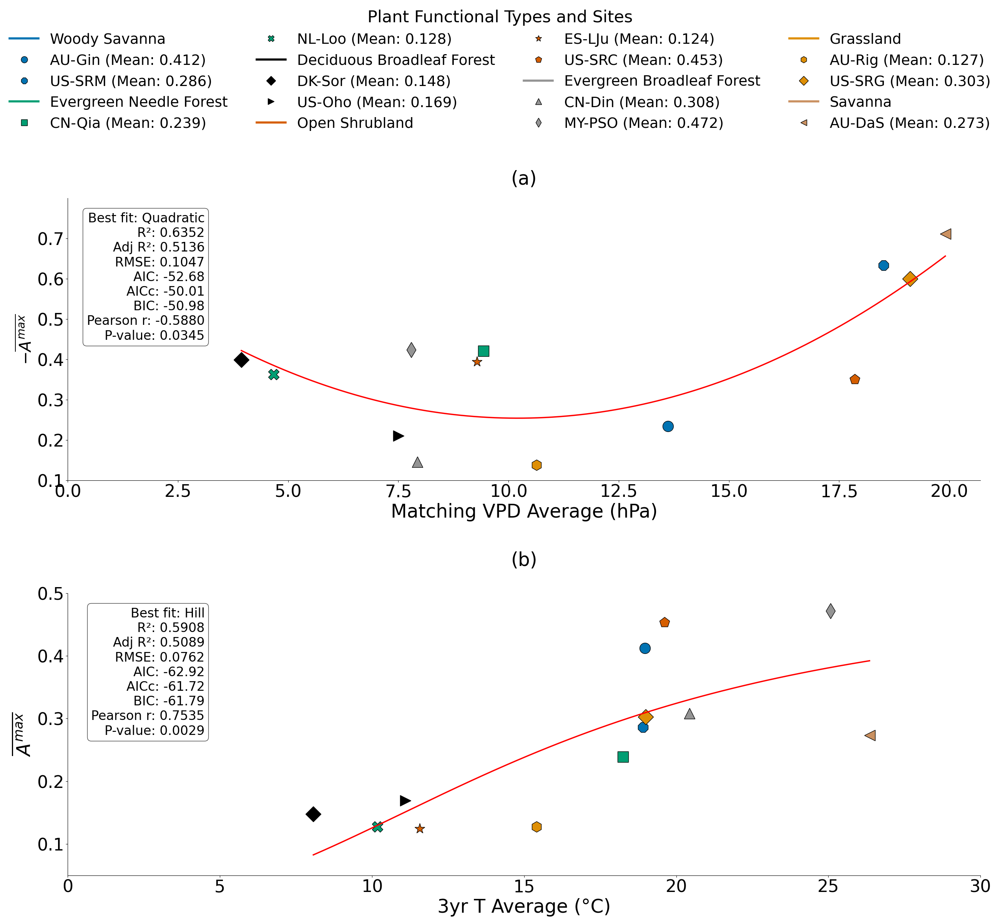


TEMPERATURE MODEL COMPARISON TABLE (sorted by BIC, where lower BIC implies better fit)
Model        R²       Adj R²   RMSE     AIC      AICc     BIC     
----------------------------------------------------------------------------------------
Hill         0.5908   0.5089   0.0762   -62.92   -61.72   -61.79  
Linear       0.5678   0.4813   0.0784   -62.21   -61.01   -61.08  
Power        0.5659   0.4791   0.0785   -62.15   -60.95   -61.02  
Sigmoid      0.6131   0.4841   0.0741   -61.65   -58.98   -59.95  
Quadratic    0.5861   0.4481   0.0767   -60.77   -58.10   -59.07  
Logarithmic  0.5766   0.4355   0.0776   -60.48   -57.81   -58.78  
Exponential  0.5678   0.4237   0.0784   -60.21   -57.54   -58.51  

VPD MODEL COMPARISON TABLE (sorted by BIC, where lower BIC implies better fit)
Model        R²       Adj R²   RMSE     AIC      AICc     BIC     
----------------------------------------------------------------------------------------
Quadratic    0.6352   0.5136   0.1047   -52.68   -5

In [33]:
# Creating 2-panel figure
fig = plt.figure(figsize=(25, 21))

# Panel A (Top) - VPD
ax_vpd = fig.add_axes([0.05, 0.50, 0.95, 0.35])
for site, data in mtch_vpd_data.items():
    ax_vpd.plot(data["vpd_mtch"], data["mtch_meanacvpd"],
                marker=data["marker"], color=data["color"],
                markeredgecolor='black', markerfacecolor=data["color"],
                label=site, markersize=20)

vpd_x_min, vpd_x_max = float(np.nanmin(vpd_x_data)), float(np.nanmax(vpd_x_data))
vpd_y_min, vpd_y_max = float(np.nanmin(vpd_y_data)), float(np.nanmax(vpd_y_data))
pad_x = 0.05 * (vpd_x_max - vpd_x_min if vpd_x_max > vpd_x_min else 1.0)

ax_vpd.set_xlabel('Matching VPD Average (hPa)', fontsize=35)
ax_vpd.set_ylabel('$-\\overline{A^{max}}$', fontsize=30)
ax_vpd.tick_params(axis='both', which='major', labelsize=32)
ax_vpd.spines['right'].set_visible(False)
ax_vpd.spines['top'].set_visible(False)
ax_vpd.set_xlim(0, vpd_x_max + pad_x)
ax_vpd.set_ylim(-0.1, -0.8)
ax_vpd.set_yticks(-np.arange(0.1, 0.71, 0.1))
ax_vpd.yaxis.set_major_formatter(mticker.FuncFormatter(lambda v, pos: f"{abs(v):.1f}"))

# Producing the VPD best-fit line
vpd_candidates = ["Linear","Quadratic","Power","Exponential","Logarithmic","Sigmoid"]
vpd_fits = fit_models(vpd_x_data, vpd_y_data, vpd_candidates, is_temp=False)
vpd_best = vpd_fits[0] if len(vpd_fits) else None

if vpd_best is not None:
    x_line = np.linspace(vpd_x_min, vpd_x_max, 500)
    y_line = vpd_best["func"](x_line, *vpd_best["params"])
    ax_vpd.plot(x_line, y_line, color='red', linestyle='-', linewidth=2.5)

if vpd_best is not None:
    vpd_textstr = (f'Best fit: {vpd_best["name"]}\n'
                   f'R²: {vpd_best["r2"]:.4f}\n'
                   f'Adj R²: {vpd_best["adj_r2"]:.4f}\n'
                   f'RMSE: {vpd_best["rmse"]:.4f}\n'
                   f'AIC: {vpd_best["aic"]:.2f}\n'
                   f'AICc: {vpd_best["aicc"]:.2f}\n'
                   f'BIC: {vpd_best["bic"]:.2f}\n'
                   f'Pearson r: {vpd_correlation:.4f}\n'
                   f'P-value: {vpd_p_value:.4f}')
else:
    vpd_textstr = f'Pearson correlation: {vpd_correlation:.4f}\nP-value: {vpd_p_value:.4f}'

props = dict(boxstyle='round', facecolor='white', alpha=0.75)
ax_vpd.text(0.15, 0.95, vpd_textstr, transform=ax_vpd.transAxes, fontsize=24,
            verticalalignment='top', horizontalalignment='right', bbox=props)

ax_vpd.text(0.5, 1.1, '(a)', transform=ax_vpd.transAxes, fontsize=35, va='top', ha='center')


# Panel B (Bottom) - Temperature
ax_temp = fig.add_axes([0.05, 0.01, 0.95, 0.35])
for site, data in temp_data.items():
    ax_temp.plot(data["temp_3yr"], data["meanactemp"],
                 marker=data["marker"], color=data["color"], 
                 markeredgecolor='black', markerfacecolor=data["color"],
                 label=site, markersize=20)

temp_x_min, temp_x_max = float(np.nanmin(temp_x_data)), float(np.nanmax(temp_x_data))
temp_y_min, temp_y_max = float(np.nanmin(temp_y_data)), float(np.nanmax(temp_y_data))

ax_temp.set_xlabel('3yr T Average (°C)', fontsize=35)
ax_temp.set_ylabel('$\\overline{A^{max}}$', fontsize=35)
ax_temp.tick_params(axis='both', which='major', labelsize=32)
ax_temp.spines['right'].set_visible(False)
ax_temp.spines['top'].set_visible(False)
ax_temp.set_xlim(0, 30)
ax_temp.set_ylim(0.05, 0.5)
ax_temp.set_yticks([0.1, 0.2, 0.3, 0.4, 0.5])

# Producing the temperature best-fit line
temp_candidates = ["Linear","Quadratic","Power","Exponential","Logarithmic","Sigmoid","Hill"]
temp_fits = fit_models(temp_x_data, temp_y_data, temp_candidates, is_temp=True)
temp_best = temp_fits[0] if len(temp_fits) else None

if temp_best is not None:
    x_line = np.linspace(temp_x_min, temp_x_max, 1000)
    y_line = temp_best["func"](x_line, *temp_best["params"])
    ax_temp.plot(x_line, y_line, color='red', linestyle='-', linewidth=2.5)

if temp_best is not None:
    temp_textstr = (f'Best fit: {temp_best["name"]}\n'
                    f'R²: {temp_best["r2"]:.4f}\n'
                    f'Adj R²: {temp_best["adj_r2"]:.4f}\n'
                    f'RMSE: {temp_best["rmse"]:.4f}\n'
                    f'AIC: {temp_best["aic"]:.2f}\n'
                    f'AICc: {temp_best["aicc"]:.2f}\n'
                    f'BIC: {temp_best["bic"]:.2f}\n'
                    f'Pearson r: {temp_correlation:.4f}\n'
                    f'P-value: {temp_p_value:.4f}')
else:
    temp_textstr = f'Pearson correlation: {temp_correlation:.4f}\nP-value: {temp_p_value:.4f}'

ax_temp.text(0.15, 0.95, temp_textstr, transform=ax_temp.transAxes, fontsize=24,
             verticalalignment='top', horizontalalignment='right', bbox=props)

ax_temp.text(0.5, 1.15, '(b)', transform=ax_temp.transAxes, fontsize=35, va='top', ha='center')

# Legend
pft_groups = {}
for site_val, (pft, site_label) in site_labels.items():
    if pft not in pft_groups:
        pft_groups[pft] = []
    pft_groups[pft].append(site_label)

legend_elements = []
for pft, color in pft_colors.items():
    if pft in pft_groups:
        legend_elements.append(plt.Line2D([0], [0], color=color, lw=4, label=pft))
        for site in pft_groups[pft]:
            if site in temp_data:  # Use temp_data for legend values
                data = temp_data[site]
                legend_elements.append(plt.Line2D([0], [0], marker=data['marker'], color='w', 
                                                  label=f"{site} (Mean: {data['meanactemp']:.3f})",
                                                  markerfacecolor=color, markersize=12, 
                                                  markeredgecolor='black'))

legend = fig.legend(handles=legend_elements, 
                   loc='upper center', 
                   bbox_to_anchor=(0.5, 1.1),  
                   fontsize=27,
                   title="Plant Functional Types and Sites", 
                   ncol=4, 
                   frameon=False)
legend.get_title().set_fontsize(31)

plt.subplots_adjust(top=0.90, bottom=0.1, left=0.1, right=0.95)
plt.show()


#Printing temperature model comparison
print("\n" + "="*80)
print("TEMPERATURE MODEL COMPARISON TABLE (sorted by BIC, where lower BIC implies better fit)")
print("="*80)
print(f"{'Model':<12} {'R²':<8} {'Adj R²':<8} {'RMSE':<8} {'AIC':<8} {'AICc':<8} {'BIC':<8}")
print("-"*88)
for model in temp_fits:
    print(f"{model['name']:<12} {model['r2']:<8.4f} {model['adj_r2']:<8.4f} {model['rmse']:<8.4f} {model['aic']:<8.2f} {model['aicc']:<8.2f} {model['bic']:<8.2f}")

#Printing VPD model comparison
print("\n" + "="*80)
print("VPD MODEL COMPARISON TABLE (sorted by BIC, where lower BIC implies better fit)")
print("="*80)
print(f"{'Model':<12} {'R²':<8} {'Adj R²':<8} {'RMSE':<8} {'AIC':<8} {'AICc':<8} {'BIC':<8}")
print("-"*88)
for model in vpd_fits:
    print(f"{model['name']:<12} {model['r2']:<8.4f} {model['adj_r2']:<8.4f} {model['rmse']:<8.4f} {model['aic']:<8.2f} {model['aicc']:<8.2f} {model['bic']:<8.2f}")




Figure 5 in the manuscript - Comparison of peak values Amax for all fluctuations at c=0 (left) and top 1% of fluctuations for c at 99% quantile (right) for each site


In [34]:

# importing necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import ttest_ind
import seaborn as sns

# Creating the colorblind-friendly palette and defining color for each Plant Functional Type (PFT)
palette = sns.color_palette("colorblind", 8)
spec_colors = {
    'USSRM': palette[0],  
    'AURIG': palette[1],  
    'USSRC': palette[3],  
    'DKSOR': '#000000'   
}
pft_colors = {
    'Woody Savanna': spec_colors['USSRM'],  
    'Evergreen Needle Forest': palette[2],
    'Deciduous Broadleaf Forest': spec_colors['DKSOR'],  
    'Open Shrubland': spec_colors['USSRC'], 
    'Evergreen Broadleaf Forest': palette[7], 
    'Grassland': spec_colors['AURIG'], 
    'Savanna': palette[5] 
}

# importing necessary files
file_names_all = [
    "AUGINPEAKS.xlsx", "CNQIAPEAKS.xlsx", "CNDINPEAKS.xlsx", "DKSORPEAKS.xlsx", 
    "ESLJUPEAKS.xlsx", "NLLOOPEAKS.xlsx", "AUDASPEAKS.xlsx", "USOHOPEAKS.xlsx", 
    "MYPSOPEAKS.xlsx", "USSRMPEAKS.xlsx", "USSRCPEAKS.xlsx", "AURIGPEAKS.xlsx", 
    "USSRGPEAKS.xlsx"
]

file_names_99 = [
    "AUGIN99PEAKS.xlsx", "CNQIA99PEAKS.xlsx", "CNDIN99PEAKS.xlsx", "DKSOR99PEAKS.xlsx", 
    "ESLJU99PEAKS.xlsx", "NLLOO99PEAKS.xlsx", "AUDAS99PEAKS.xlsx", "USOHO99PEAKS.xlsx", 
    "MYPSO99PEAKS.xlsx", "USSRM99PEAKS.xlsx", "USSRC99PEAKS.xlsx", "AURIG99PEAKS.xlsx", 
    "USSRG99PEAKS.xlsx"
]

# creating site specfifcations and site labels
site_specs = {
    'Woody Savanna (AU-Gin)': (pft_colors['Woody Savanna'], ''),
    'Woody Savanna (US-SRM)': (pft_colors['Woody Savanna'], '//'),
    'Evergreen Needle Forest (CN-Qia)': (pft_colors['Evergreen Needle Forest'], ''),
    'Evergreen Needle Forest (NL-Loo)': (pft_colors['Evergreen Needle Forest'], '//'),
    'Deciduous Broadleaf Forest (DK-Sor)': (pft_colors['Deciduous Broadleaf Forest'], ''),
    'Deciduous Broadleaf Forest (US-Oho)': (pft_colors['Deciduous Broadleaf Forest'], '//'),
    'Open Shrubland (ES-LJu)': (pft_colors['Open Shrubland'], ''),
    'Open Shrubland (US-SRC)': (pft_colors['Open Shrubland'], '//'),
    'Savanna (AU-DaS)': (pft_colors['Savanna'], ''),
    'Evergreen Broadleaf Forest (CN-Din)': (pft_colors['Evergreen Broadleaf Forest'], ''),
    'Evergreen Broadleaf Forest (MY-PSO)': (pft_colors['Evergreen Broadleaf Forest'], '//'),
    'Grassland (AU-Rig)': (pft_colors['Grassland'], ''),
    'Grassland (US-SRG)': (pft_colors['Grassland'], '//')
}

site_labels = {
    'AUGIN': 'Woody Savanna (AU-Gin)', 'USSRM': 'Woody Savanna (US-SRM)',
    'CNQIA': 'Evergreen Needle Forest (CN-Qia)', 'NLLOO': 'Evergreen Needle Forest (NL-Loo)',
    'DKSOR': 'Deciduous Broadleaf Forest (DK-Sor)', 'USOHO': 'Deciduous Broadleaf Forest (US-Oho)',
    'ESLJU': 'Open Shrubland (ES-LJu)', 'USSRC': 'Open Shrubland (US-SRC)',
    'CNDIN': 'Evergreen Broadleaf Forest (CN-Din)', 'MYPSO': 'Evergreen Broadleaf Forest (MY-PSO)',
    'AURIG': 'Grassland (AU-Rig)', 'USSRG': 'Grassland (US-SRG)',
    'AUDAS': 'Savanna (AU-DaS)'
}



/var/folders/tc/krjl03bn2cgbs5z5128vc9y80000gn/T/ipykernel_3132/3710373487.py:28: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  boxplots = ax.boxplot(comb_data,


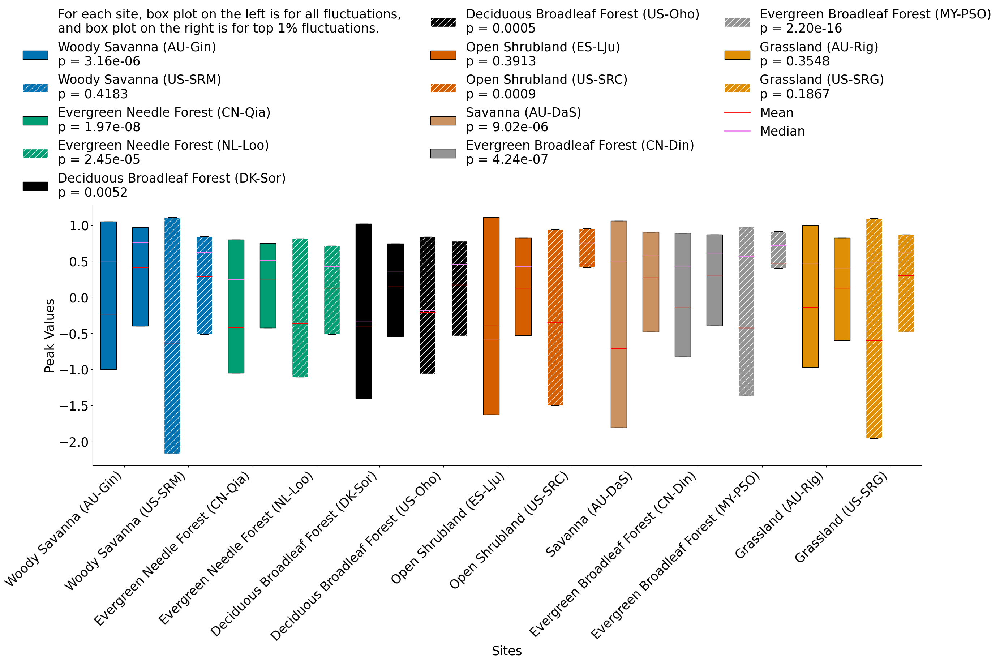

In [ ]:

# Reading data for all anf top 1% fluctuations
site_data_all = {}
for file in file_names_all:
    site_val = file[:5]
    if site_val in site_labels:
        label = site_labels[site_val]
        df = pd.read_excel(f"/Users/nikhi/Desktop/PROJ1LIT/fluxnet sites/ERRORBAR/{file}")
        site_data_all[label] = df.iloc[:, 0].dropna()
site_data_99 = {}
for file in file_names_99:
    site_val = file[:6]
    if site_val[:5] in site_labels:
        label = site_labels[site_val[:5]]
        df = pd.read_excel(f"/Users/nikhi/Desktop/PROJ1LIT/fluxnet sites/ERRORBAR/{file}")
        site_data_99[label] = df.iloc[:, 0].dropna()

#  plotting
fig = plt.figure(figsize=(27, 12))
ax = fig.add_axes([0.1, 0.15, 0.85, 0.6])  
comb_data = []
labels = []

for site in site_specs.keys():
    comb_data.append(site_data_all[site])
    comb_data.append(site_data_99[site])
    labels.append(site)

boxplots = ax.boxplot(comb_data, 
                      patch_artist=True, 
                      labels=[label for label in labels for _ in (0, 1)],
                      showfliers=False,
                      whis=[25, 75],
                      medianprops={"color": "violet"})
for i, (patch, (site, (color, hatch))) in enumerate(zip(boxplots['boxes'][::2], site_specs.items())):
    patch.set_facecolor(color)
    patch.set_edgecolor('black')
    if hatch:
        patch.set_hatch(hatch)
        patch.set_edgecolor('white')  
    patch = boxplots['boxes'][2*i+1]
    patch.set_facecolor(color)
    patch.set_edgecolor('black')
    if hatch:
        patch.set_hatch(hatch)
        patch.set_edgecolor('white')  
    
    mean_all = np.mean(site_data_all[site])
    ax.hlines(mean_all, xmin=2*i+1-0.25, xmax=2*i+1+0.25, color='red', linewidth=1)
    mean_99 = np.mean(site_data_99[site])
    ax.hlines(mean_99, xmin=2*i+2-0.25, xmax=2*i+2+0.25, color='red', linewidth=1)

ax.set_xticks([i+1.5 for i in range(0, len(labels)*2, 2)])
ax.set_xticklabels(labels, rotation=45, ha='right', fontsize=25)
ax.tick_params(axis='y', labelsize=25)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_xlabel('Sites', fontsize=25)
ax.set_ylabel('Peak Values', fontsize=25)

# creating legend
legend_elements = []
legend_elements.append(plt.Line2D([0], [0], color='white', 
                       label='For each site, box plot on the left is for all fluctuations, \nand box plot on the right is for top 1% fluctuations.'))
for site, (color, hatch) in site_specs.items():
    t_stat, p_value = ttest_ind(site_data_all[site], site_data_99[site])
    formatted_p_val = f'{p_value:.4f}' if p_value >= 1e-4 else f'{p_value:.2e}'
    rect = plt.Rectangle((0, 0), 1, 1, facecolor=color, edgecolor='black')
    if hatch:
        rect.set_hatch(hatch)
        rect.set_edgecolor('white') 
    legend_elements.append((rect, f'{site}\np = {formatted_p_val}'))

legend_elements.append((plt.Line2D([0], [0], color='red', linewidth=2), 'Mean'))
legend_elements.append((plt.Line2D([0], [0], color='violet', linewidth=2), 'Median'))

handles = []
labels = []
for elem in legend_elements:
    if isinstance(elem, tuple):
        handles.append(elem[0])
        labels.append(elem[1])
    else:
        handles.append(elem)
        labels.append(elem.get_label())

legend = ax.legend(handles=handles, labels=labels,
                  loc='upper center', 
                  fontsize=25, 
                  ncol=3,
                  frameon=False, 
                  bbox_to_anchor=(0.5, 1.8))
plt.show()



Figure 6 in the manuscript - Universal sign flip in NEP temporal asymmetry


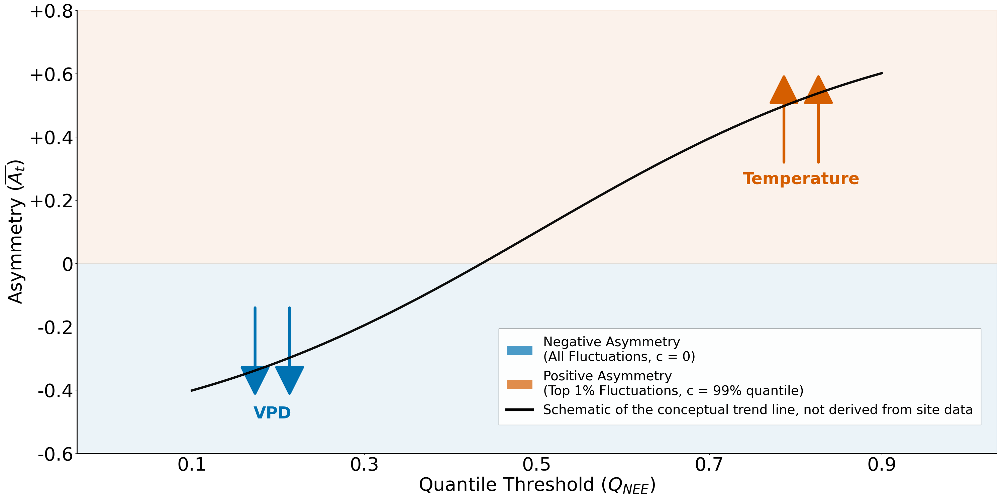

In [37]:
# importing necessary libraries
import numpy as np
import matplotlib.pyplot as plt

# defining colors for positive and negative asymmetry
COLOR_POS = "#D55E00"  
COLOR_NEG = "#0072B2" 

fig, ax = plt.subplots(1, 1, figsize=(30, 15))

# producing the S-curve
x_curve = np.linspace(-0.3, 0.3, 200)
y_curve = 0.7 * np.tanh(3 * x_curve) + 0.1
ax.plot(x_curve, y_curve, linewidth=5, color='black', alpha=0.95, zorder=4)
ax.set_xlabel("Quantile Threshold ($Q_{NEE}$)", fontsize=40)
ax.set_ylabel("Asymmetry ($\\overline{A_t}$)", fontsize=40)
ax.set_xlim(-0.4, 0.4)
ax.set_ylim(-0.6, 0.8)
yticks = [-0.6, -0.4, -0.2, 0, 0.2, 0.4, 0.6, 0.8]
ax.set_yticks(yticks)
ax.set_yticklabels([f"{v:+.1f}" if v != 0 else "0" for v in yticks], fontsize=40)
ax.set_xticks([-0.3, -0.15, 0.0, 0.15, 0.3])
ax.set_xticklabels(["0.1", "0.3", "0.5", "0.7", "0.9"], fontsize=40)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_linewidth(2)
ax.spines["bottom"].set_linewidth(2)
ax.axhspan(-0.6, 0, color=COLOR_NEG, alpha=0.08, zorder=0)
ax.axhspan(0, 0.8, color=COLOR_POS, alpha=0.08, zorder=0)

# Making regime markers for all fluctuations and top 1% fluctuations
x_all  = -0.39  
x_top1 =  0.39   


for dx in (-0.015, 0.015):
    ax.annotate("", xy=(0.23+dx, 0.60), xytext=(0.23+dx, 0.32),
                arrowprops=dict(arrowstyle="-|>", lw=6, color=COLOR_POS,
                                mutation_scale=140, shrinkA=0, shrinkB=0), zorder=3)
ax.text(0.23, 0.24, "Temperature", ha="center", va="bottom",
        fontsize=35, fontweight="bold", color=COLOR_POS)

for dx in (-0.015, 0.015):
    ax.annotate("", xy=(-0.23+dx, -0.42), xytext=(-0.23+dx, -0.14),
                arrowprops=dict(arrowstyle="-|>", lw=6, color=COLOR_NEG,
                                mutation_scale=140, shrinkA=0, shrinkB=0), zorder=3)
ax.text(-0.23, -0.45, "VPD", ha="center", va="top",
        fontsize=35, fontweight="bold", color=COLOR_NEG)


legend_elements = [
    plt.Rectangle((0,0),1,1, facecolor='#0072B2', alpha=0.7, label='Negative Asymmetry\n(All Fluctuations, c = 0)'),
    plt.Rectangle((0,0),1,1, facecolor='#D55E00', alpha=0.7, label='Positive Asymmetry\n(Top 1% Fluctuations, c = 99% quantile)'),
    plt.Line2D([0, 1], [0, 1], color='black', linewidth=6, linestyle='-', label='Schematic of the conceptual trend line, not derived from site data')
]
legend = ax.legend(
    handles=legend_elements,
    loc='lower right',
    bbox_to_anchor=(0.99, 0.05),  
    fontsize=28,
    frameon=True,
    fancybox=False,               
    framealpha=0.95,
    facecolor='white',
    edgecolor='0.4',
    borderpad=0.6
)

plt.tight_layout()
plt.show()